In [1]:
from dataccess.nbfunctions import *
from dataccess import utils, query, mec, datashow
from dataccess.summarymetrics import plt, histogram, scatter
import config

from scipy.stats import pearsonr

%matplotlib inline

## Software progress:

* Simplified interface geared toward the browser-based IPython notebook (more user-friendly than the command line)
* Better visualization
* New scheme for doing event selection (replaces the google spreadsheet-driven workflow, which I found too unweildy and inflexible)

### Ongoing work
* Code cleanup
* Add support for running jobs on SLAC's cluster from within IPython.  

### Example: defining a dataset with event selection

#### Define dataset for MgO runs with focal spot sizes equal to 2 um:

In [2]:
dataset = get_query_dataset('material MgO focal_size 2')
print dataset.label

Runs:  [878, 886, 906, 990, 1045]
material_MgO_focal_size_2


#### Now define a second dataset using the same query parameters plus a filter function that rejects pulses with energy below 1.5 mJ, as measured by the GMD:

In [3]:
# The filter function:
def gmd_large(eventdata, **kwargs):
    return bool(eventdata > 1.5)

dataset_filtered_by_gmd_value = get_query_dataset('material MgO focal_size 2',
        event_filter = gmd_large, event_filter_detid = 'GMD', alias = 'material_MgO_focal_size_2_GMDfiltered')

print dataset_filtered_by_gmd_value.label

Runs:  [878, 886, 906, 990, 1045]
material_MgO_focal_size_2_GMDfiltered


#### Now plot a histogram of integrated signal on the si spectrometer detector for these two datasets. There's a correlation between GMD (gas monitor detector) value and integrated signal on the Si spectrometer, as we'd hope:

In [4]:
histogram([dataset, dataset_filtered_by_gmd_value], 'si', separate = True)

## Data analysis: general observations
### 1. Normalization to x-ray pulse intensity

* Let's look at correlations of different measures of pulse intensity.
* Below we make a scatter plot of Si spectrometer signal vs. readout of the upstream GMD for run 1045, which had relatively strong signal.
* We compare to the same pair of data for run 924, a dark run. This gives a visual estimate of a lower bound on how much event-to-event fluctuation is due to intrinsic detector noise.
* Under the plot we print the Pearson correlation coefficient for run 1045.

In [5]:
def identity(detval, **kwargs):
    return detval

scatter('924', ('si', mec.si_imarr_sum), ('GMD', identity), show = False)
pearsonr(*scatter('1045', ('si', mec.si_imarr_sum), ('GMD', identity)))

(0.59218641546819795, 1.8369677891329347e-64)

#### Repeat, comparing integrated counts on the si spectrometer and quad2:

In [6]:
scatter('924', ('si', mec.si_imarr_sum), ('quad2', utils.usum), show = False)
pearsonr(*scatter('1045', ('si', mec.si_imarr_sum), ('quad2', utils.usum)))

(0.055952687622717039, 0.1570824146557161)

#### Repeat, comparing GMD and quad2:

In [7]:
scatter('924', ('GMD', identity), ('quad2', utils.usum), show = False)
pearsonr(*scatter('1045', ('GMD', identity), ('quad2', utils.usum)))

(0.063704200858380342, 0.10765464703750732)

### Conclusion: Si spectrometer provides the best measure of intensity

### 2. Distributions of incident fluence
* Motivating question: can we extract finer gradations of fluence by sorting events within each nominal dataset by pulse intensity?

#### Define datasets spanning the full range of focal spot sizes that we used in 1C mode: 

In [8]:
MgO_ref_short = [get_query_dataset('material MgO runs 870 961 transmission 1. focal_size %d' % spotsize,
                                'MgO.ref.1C.short2.%sum' % spotsize, print_enable = False)
                                for spotsize in [4, 8, 18, 28, 38, 48, 58]]
# One of the 2 um runs is garbage, so we select the good one by run number:
MgO_ref_short.insert(0, get_query_dataset('runs 906 906', 'MgO.ref.1C.short2um', print_enable = False)) 

#### Histogram of pulse intensity for each datasets (units of $J/cm^2$ on the horizontal axis). There's indeed overlap for the largest focal spot sizes:

In [9]:
plt.xscale('log')
histogram(MgO_ref_short, 'si', event_data_getter=config.onecolor_fluence, separate = True)

### 3. MgO 1C triage summary

* The apparent dramatic quenching of high-order peak intensities with increasing fluence was not genuine! It was the result of masking of the downstream CSPAD. The size of the masked region changed as we rastered vertically (compare the images of runs 886 and 891 below). 
* In summary, approximately 2/3 of the MgO ref data appears to partially to totally unusable. We have a complete dataset for short pulse duration alone.

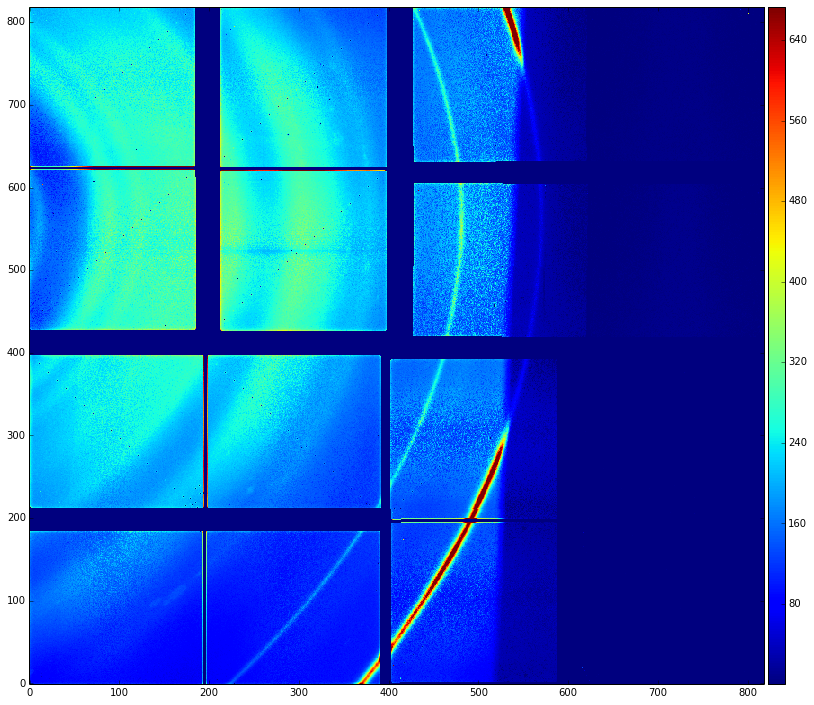

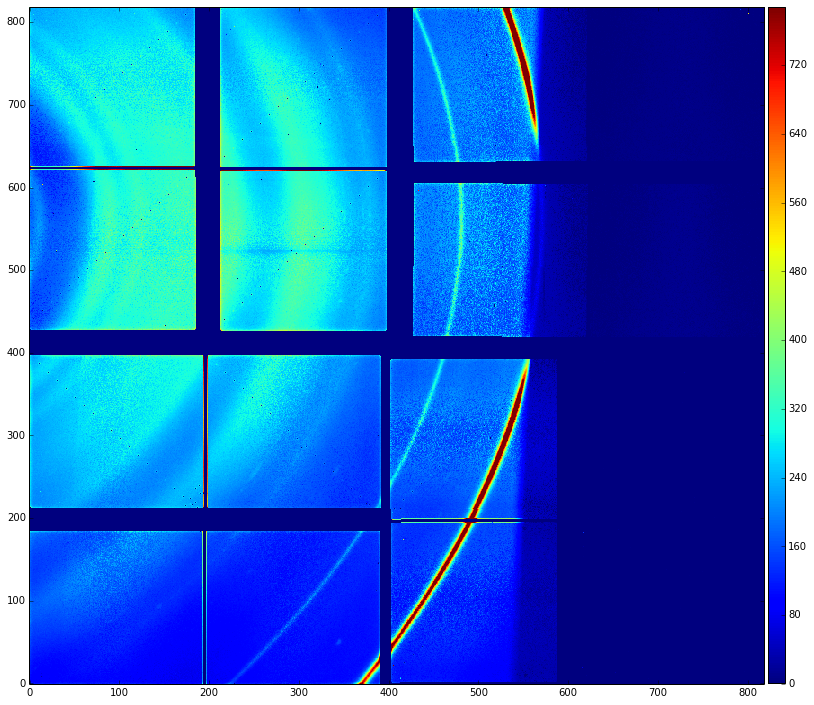

In [10]:
datashow.main(['886'], 'quad2')
datashow.main(['891'], 'quad2')

### MgO 1C analysis continued

#### Upstream CSPAD has a couple visible peaks, and Alex's most recent geometry calibration looks excellent!

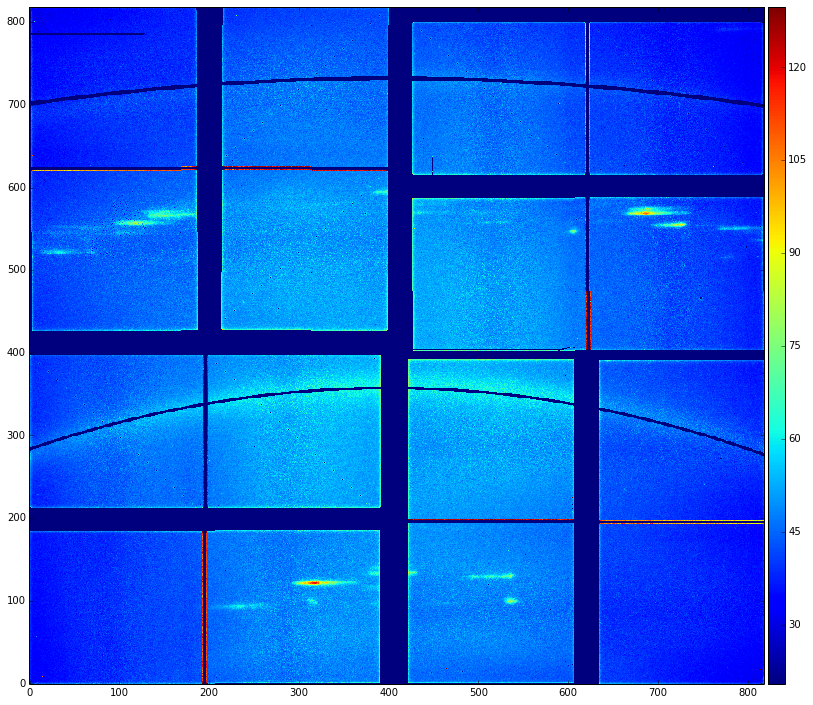

In [11]:
datashow.main(['891'], 'quad1', fiducials = [109.5, 130.])

#### Plot raw powder patterns for the full range of focal spot sizes:

In [12]:
plot_xrd(MgO_ref_short, compound_list = ['MgO'], normalization = None, bgsub = False, plot_patterns = True)

#### Focal spot sizes $2~\mu m$ and $28~\mu m$ have poor signal to background and will be excluded for now. With background subtraction, and plotting data from both CSPADs:

In [3]:
MgO_ref_short_clean = [get_query_dataset('material MgO runs 870 961 transmission 1. focal_size %d' % spotsize,
                                'MgO.ref.1C.short2.%sum' % spotsize, print_enable = False)
                                for spotsize in [4, 8, 18, 38, 48, 58]]

In [27]:
plot_xrd(MgO_ref_short_clean, compound_list = ['MgO'], normalization = 'peak', bgsub = True,
         plot_patterns = True, detectors = ['quad2', 'quad1'])

#### Finally, here's the progression of peak intensities:

In [15]:
plot_xrd(MgO_ref_short_clean, compound_list = ['MgO'], normalization = 'peak',
         bgsub = True, plot_progression = True,  detectors = ['quad2', 'quad1'])

#### The behavior of the highest-order peak looks pretty suspicious. What happens as we split datasets by fluence to increase the number of points?

#### Split the datasets corresponding to focal spot sizes of 48, 38, and 28 microns:

In [21]:
focal48, focal38, focal28 = MgO_ref_short_clean[-4:-1][::]
def split_dataset(ds):
    """Given a dataset ds, return two new datasets resulting from splitting it by pulse intensity"""
    mean_si = np.mean(ds.evaluate('si', mec.si_imarr_sum).flat_event_data())
    def below_mean(imarr, **kwargs):
        return mec.si_imarr_sum(imarr) < mean_si
    def above_mean(imarr, **kwargs):
        return not below_mean(imarr)
    label_base = '_'.join(map(str, ds.runs))
    ds_lower = query.DataSet(ds.runs, event_filter = below_mean, event_filter_detid = 'si', label = label_base + 'lower')
    ds_upper = query.DataSet(ds.runs, event_filter = above_mean, event_filter_detid = 'si', label = label_base + 'upper')
    return ds_lower, ds_upper

In [14]:
focal48_lower, focal48_upper = split_dataset(focal48)
focal38_lower, focal38_upper = split_dataset(focal38)
focal28_lower, focal28_upper = split_dataset(focal28)
tseq = MgO_ref_short_clean[:-4] + [focal28_lower, focal28_upper, focal38_lower, focal38_upper,
                                   focal48_lower, focal48_upper] + [MgO_ref_short_clean[-1]]

In [26]:
plot_xrd(tseq, compound_list = ['MgO'], normalization = 'peak',
         bgsub = True, plot_progression = True,  detectors = ['quad2', 'quad1'])

### What next?

* Getting a better handle on background subtraction and estimation of poweder peak integrals.
* See whether we can get smoother progressions by taking smaller bins in flux.

### Misc. other stuff

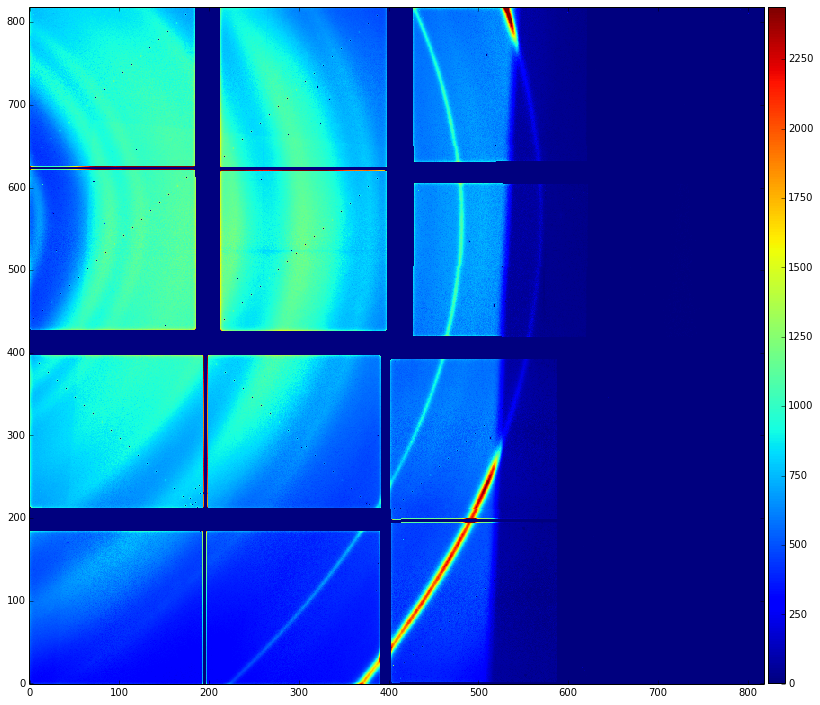

In [5]:
datashow.main(['878'], 'quad2')

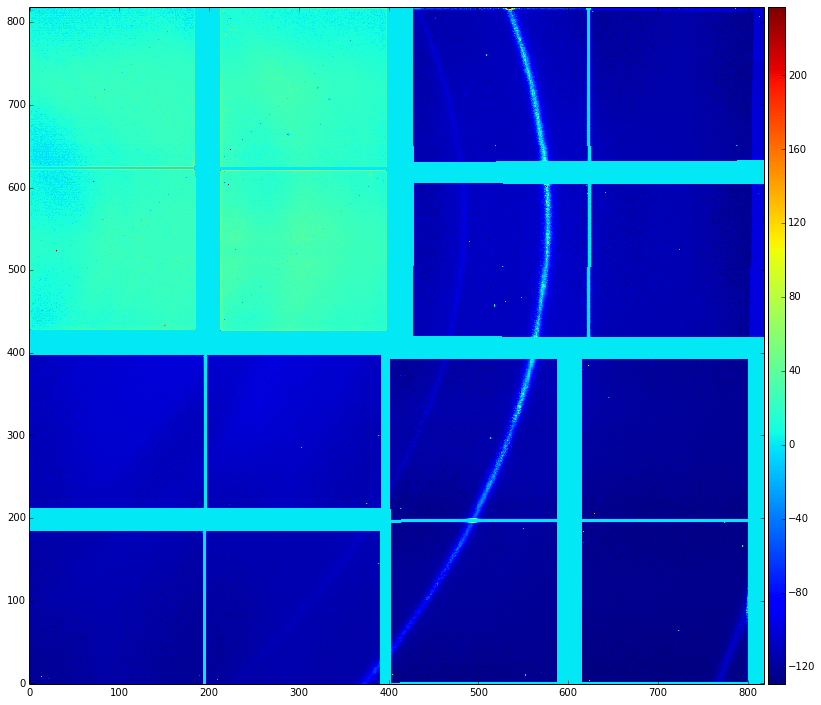

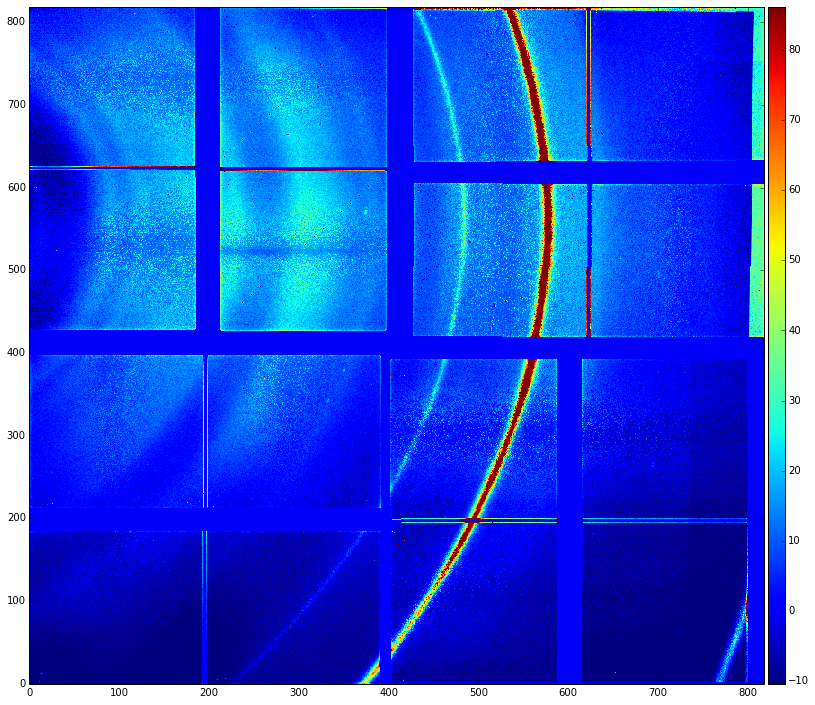

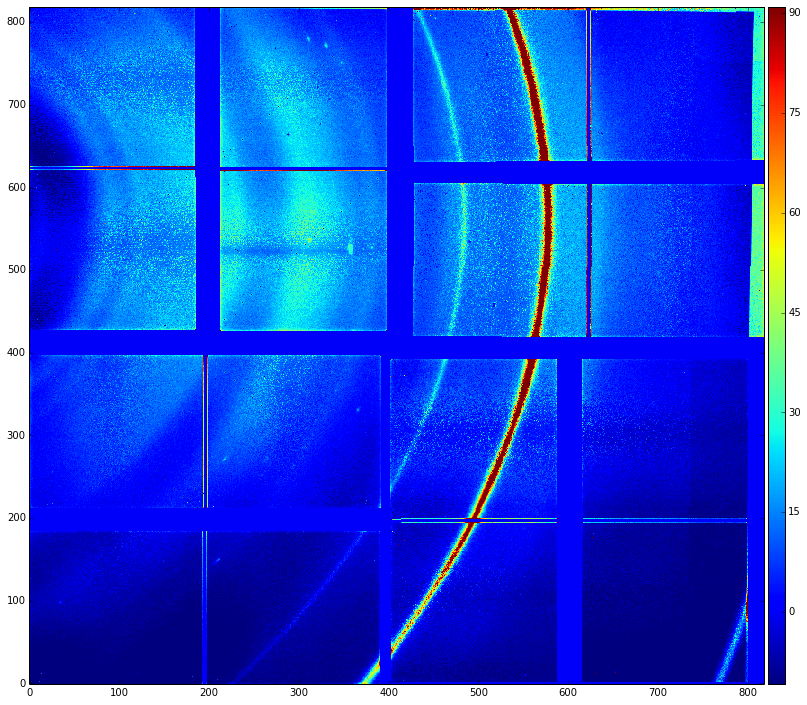

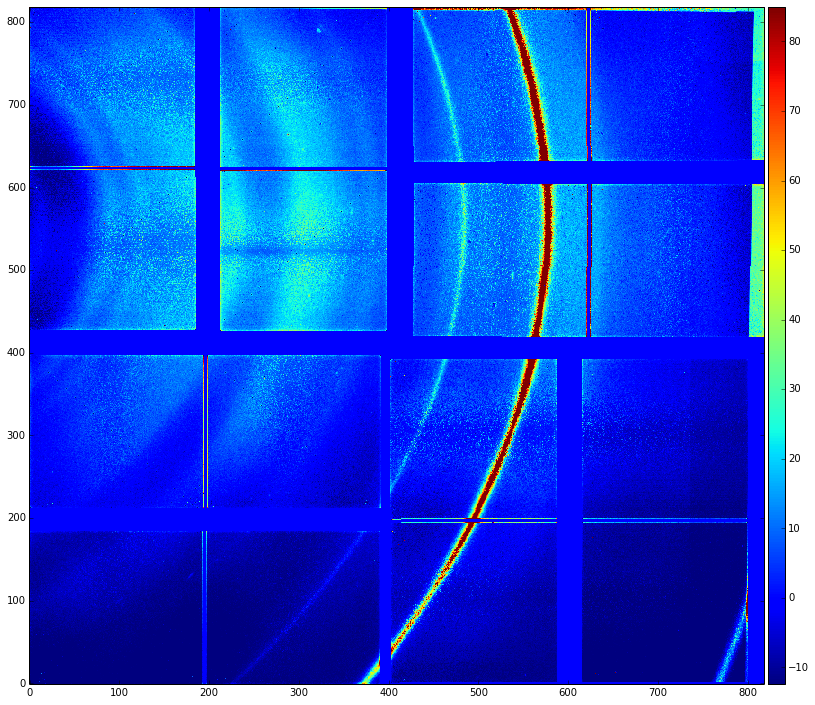

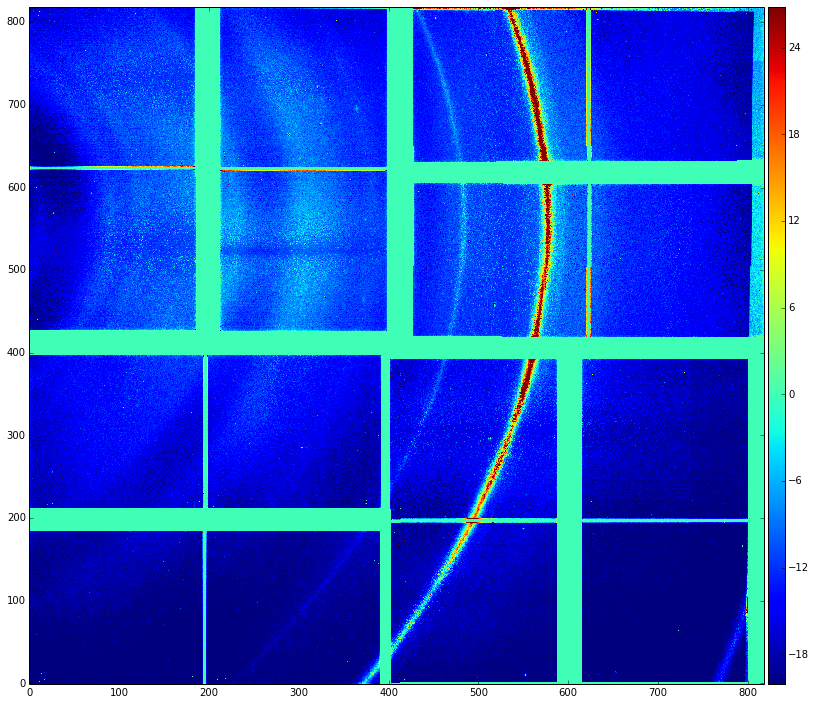

...

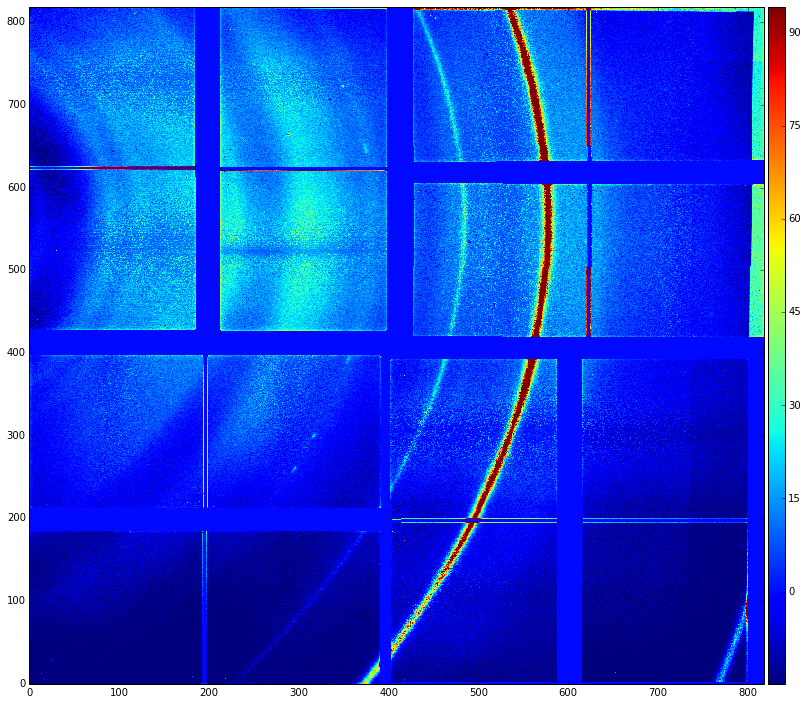

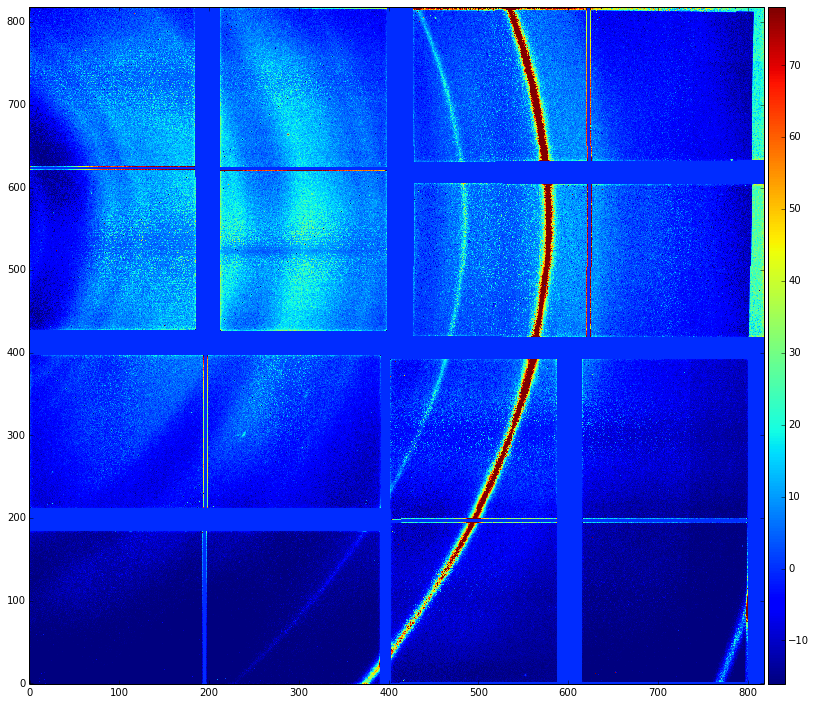

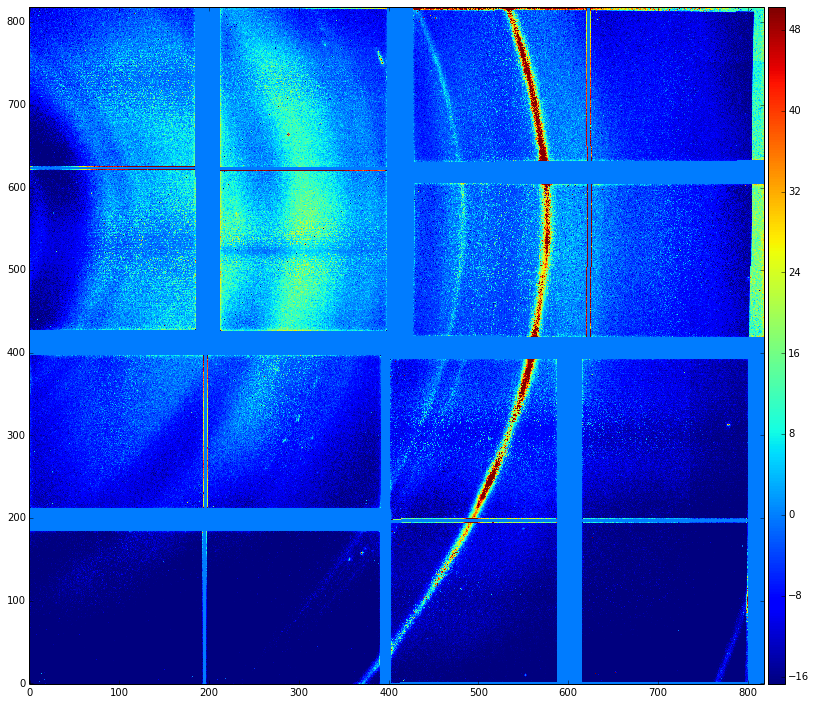

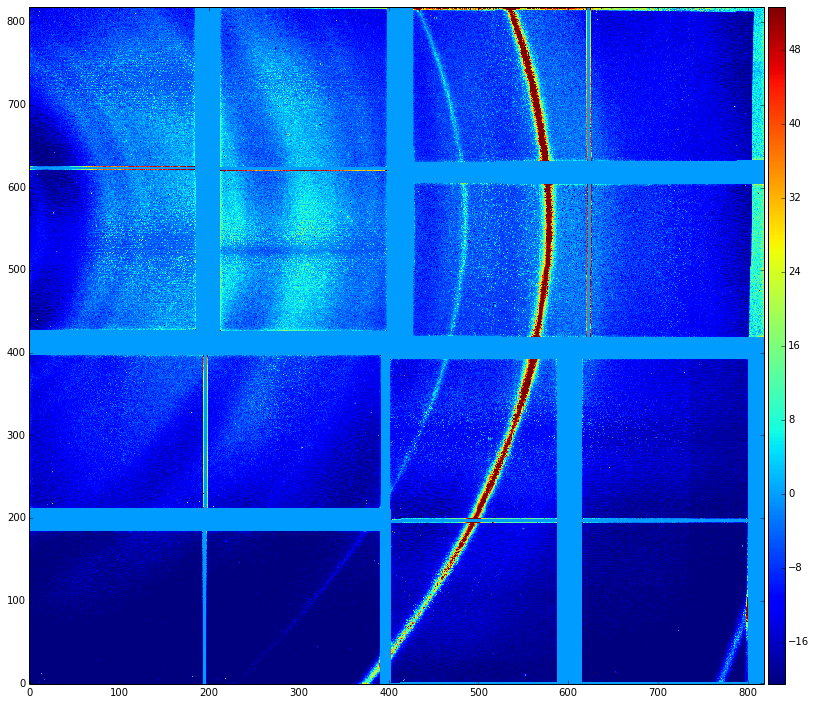

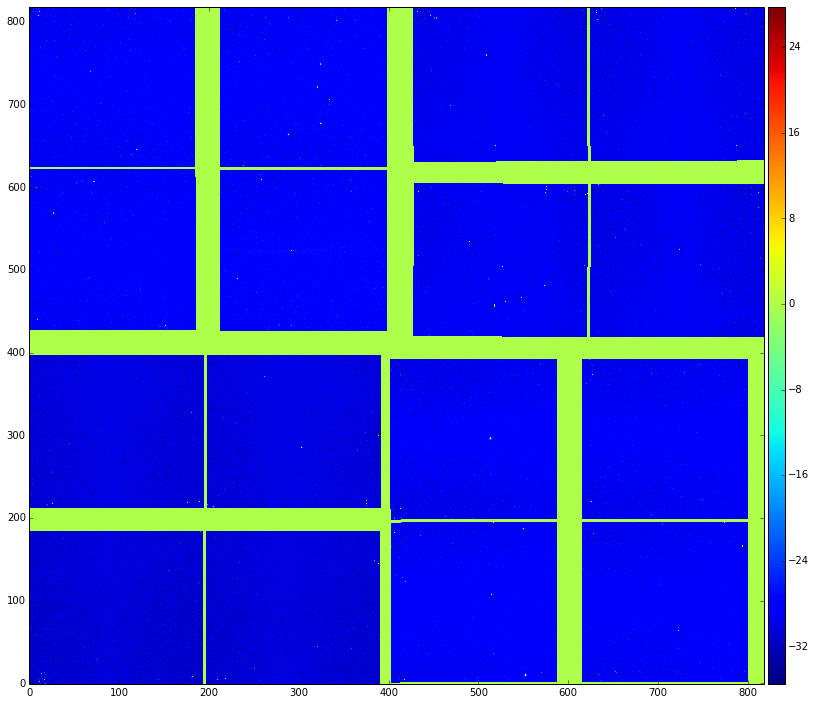

['906', '911', '912', '913', '914', '916', '917', '918', '921', '922', '923']


In [10]:
runs = get_run_strings(MgO_ref_short)
[datashow.main([run], 'quad2') for run in runs]
print runs

In [18]:
make_summary_table()

,1C short pulse,1C long pulse,2C short delay (< 70 fs),2C long delay (> 70 fs)
Fe$_{3}$O$_4$ ref,24,17,149,150
Fe$_3$O$_4$ HEF,14,15,0,0
MgO ref,26,15,40,62
MgO HEF,16,0,0,0
Graphite ref,15,0,100,50


TODO: run 1047 seems to be missing a transmission value in the logbook (or does that just indicate that it's bad? This comes back to the need to implement a way to clearly flag bad runs via the logbook).

In [4]:
MgO_ref_long = [get_query_dataset('material MgO runs 1016 1070 focal_size %d' % spotsize,
                                'MgO.ref.1C.long.%sum' % spotsize, print_enable = True)
                                for spotsize in [2, 4, 8, 18, 28, 38, 48, 58]]

Runs:  [1045]
Runs:  [1046]
Runs:  [1047]
Runs:  [1052]
Runs:  [1053]
Runs:  [1055, 1056]
Runs:  [1057, 1058]
Runs:  [1059, 1060]
